# **EDA: VOICe Dataset (Zenodo)**

- **Fuente:** https://zenodo.org/records/3514950
- **Paper:** [arxiv.org/abs/1911.07098](https://arxiv.org/abs/1911.07098)  
- **Autores:** Shayan Gharib, Konstantinos Drossos, Eemi Fagerlund, Tuomas Virtanen
- **Nota sobre el tamaño:** El dataset completo pesa ~44 GB.

Este dataset contiene **1449 mezclas** de tres eventos sonoros: llanto de bebé, rotura de cristal y disparos. A su vez, están mezclados con ruido de fondo de tres escenas acústicas: vehículos, ruido exterior y ruido interior. Es especialmente útil para el proyecto porque simula condiciones reales de detección, ya que los sonidos de emergencia no aparecen en silencio sino mezclados con el ruido del entorno.

## **Descripción**

| Propiedad | Valores |
|-----------|--------|
| **Eventos sonoros** | Baby Crying · Glass Breaking · Gunshot |
| **Escenas acústicas** | Vehicle · Outdoors · Indoors |
| **Condiciones SNR** | Clean · -3 dB · -9 dB |
| **Total mezclas** | 1449 (207 clean + 621 por cada SNR) |
| **Formato** | `.wav`, 3 archivos `.7z` (~44 GB en total) |

## **1. Dependencias**

In [1]:
# Instalar dependencias necesarias
!pip install librosa soundfile matplotlib seaborn pandas numpy scikit-learn tqdm py7zr -q

In [2]:
import os
import glob
import py7zr
import subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import librosa
import librosa.display
import warnings
import urllib.request
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm import tqdm
from IPython.display import Audio, display

In [3]:
# Estilo visual
sns.set_theme(style='whitegrid', palette='muted')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 11

PALETTE = {
    'babycry': 'purple',
    'glassbreak': 'steelblue',
    'gunshot': 'red'
}
SOUND_EVENTS = ['babycry', 'glassbreak', 'gunshot']
SCENES = ['vehicle', 'outdoors', 'indoors']

print('Librerías cargadas.')

Librerías cargadas.


In [4]:
os.makedirs('./VOICe', exist_ok=True)

subprocess.run([
    'wget', '-c', '--show-progress',
    '-O', './VOICe/VOICe_clean.7z',
    'https://zenodo.org/records/3514950/files/VOICe_clean.7z?download=1'
], check=True)

CompletedProcess(args=['wget', '-c', '--show-progress', '-O', './VOICe/VOICe_clean.7z', 'https://zenodo.org/records/3514950/files/VOICe_clean.7z?download=1'], returncode=0)

In [5]:
subprocess.run(['7z', 'x', './VOICe/VOICe_clean.7z', '-o./VOICe', '-y'], check=True)

with open('./VOICe/clean/annotation/synthetic_142.txt', 'r') as f:
    print(f.read())

2.00	5.98	babycry
5.00	5.44	glassbreak
5.00	6.16	gunshot
9.16	9.68	gunshot
9.44	10.14	glassbreak
10.98	15.62	babycry
12.68	14.60	gunshot
13.14	14.28	glassbreak
17.28	20.12	glassbreak
17.62	19.48	babycry
18.60	19.32	gunshot
23.48	26.14	babycry
24.32	24.94	gunshot
25.12	25.68	glassbreak
27.94	29.20	gunshot
29.68	30.62	glassbreak
30.14	33.36	babycry
34.20	35.44	gunshot
35.62	36.90	glassbreak
36.36	37.92	babycry
36.44	37.70	gunshot
38.90	40.36	glassbreak
39.92	41.60	babycry
41.36	42.18	glassbreak
41.70	42.26	gunshot
45.18	46.32	glassbreak
45.26	48.06	gunshot
46.60	47.76	babycry
47.32	48.42	glassbreak
51.06	51.98	gunshot
51.76	53.60	babycry
53.42	54.32	glassbreak
53.98	54.98	gunshot
56.32	57.92	glassbreak



## **2. Carga del dataset**

In [6]:
BASE_DIR = './VOICe'
os.makedirs(BASE_DIR, exist_ok=True)

ZENODO_BASE = 'https://zenodo.org/records/3514950/files'

ALL_SUBSETS = {
    'VOICe_clean.7z': f'{ZENODO_BASE}/VOICe_clean.7z?download=1', # ~3.5 GB
    'VOICe_snr_-3dB.7z': f'{ZENODO_BASE}/VOICe_snr_-3dB.7z?download=1', # ~20.3 GB
    'VOICe_snr_-9dB.7z': f'{ZENODO_BASE}/VOICe_snr_-9dB.7z?download=1', # ~20.3 GB
}

EXPECTED_SIZES_GB = {
    'VOICe_clean.7z': 3.5,
    'VOICe_snr_-3dB.7z': 20.3,
    'VOICe_snr_-9dB.7z': 20.3,
}

# Cambiar esta lista para descargar menos subsets
SUBSETS_TO_DOWNLOAD = ['VOICe_clean.7z']  # Agregar los demás si los necesitamos
# SUBSETS_TO_DOWNLOAD = ['VOICe_clean.7z', 'VOICe_snr_-3dB.7z', 'VOICe_snr_-9dB.7z']

def download_with_wget(fname, url, dest_dir):
    dest = os.path.join(dest_dir, fname)
    if os.path.exists(dest):
        size_gb = os.path.getsize(dest) / 1e9
        expected = EXPECTED_SIZES_GB.get(fname, 0)
        if expected and size_gb < expected * 0.9:
            print(f'Incompleto ({size_gb:.2f} GB). Volviendo a descargar...')
            os.remove(dest)
        else:
            print(f'Ya existe: {fname} ({size_gb:.2f} GB)')
            return dest

    print(f'Descargando {fname} con wget...')
    # -c permite reanudar si se corta y --show-progress muestra una barra bonita
    subprocess.run([
        'wget', '-c', '--show-progress', '-O', dest, url
    ], check=True)
    print(f'Descargado: {fname}')
    return dest

def extract_if_missing(archive_path, dest_dir):
    folder_name = os.path.basename(archive_path).replace('.7z', '')
    folder_path = os.path.join(dest_dir, folder_name)
    if os.path.exists(folder_path):
        print(f'Ya extraído: {folder_name}')
        return folder_path
    print(f'Extrayendo {os.path.basename(archive_path)}...')
    subprocess.run(['7z', 'x', archive_path, f'-o{dest_dir}', '-y'], check=True)
    print(f'Extraído en: {folder_path}')
    return folder_path

for fname in SUBSETS_TO_DOWNLOAD:
    zpath = download_with_wget(fname, ALL_SUBSETS[fname], BASE_DIR)
    extract_if_missing(zpath, BASE_DIR)

Ya existe: VOICe_clean.7z (3.53 GB)
Extrayendo VOICe_clean.7z...
Extraído en: ./VOICe/VOICe_clean


## **3. Construcción del DataFrame de metadatos**

In [7]:
print(os.listdir('./VOICe/clean'))

['audio', 'target', 'annotation', 'source']


In [8]:
SUBSET_MAP = {
    'clean': 'clean',
    'VOICe_snr_-3dB': 'snr_-3dB',
    'VOICe_snr_-9dB': 'snr_-9dB',
}

def parse_annotation_file(annotation_filepath):
    event = 'unknown'
    scene = 'none'
    try:
        with open(annotation_filepath, 'r') as f:
            for line in f:
                line = line.strip()
                if line.startswith('event='):
                    event = line.split('=')[1].replace(' ', '_').lower()
                elif line.startswith('scene='):
                    scene = line.split('=')[1].replace(' ', '_').lower()
    except FileNotFoundError:
        print(f"Warning: Annotation file not found: {annotation_filepath}")
    return event, scene

records = []
ann_dir = './VOICe/clean/annotation'

for txt_path in glob.glob(os.path.join(ann_dir, '*.txt')):
    fname = os.path.basename(txt_path).replace('.txt', '')
    wav_path = f'./VOICe/clean/audio/{fname}.wav'

    with open(txt_path, 'r') as f:
        for line in f:
            parts = line.strip().split('\t')
            if len(parts) == 3:
                start, end, event = parts
                records.append({
                    'filename': fname,
                    'filepath': wav_path,
                    'subset': 'clean',
                    'start': float(start),
                    'end': float(end),
                    'duration': float(end) - float(start),
                    'sound_event': event.strip(),
                })

df = pd.DataFrame(records)
print(f'Total eventos: {len(df)}')

Total eventos: 12169


In [9]:
print(df['sound_event'].unique())

['glassbreak' 'gunshot' 'babycry']


In [10]:
print(f'\nSubset:\n{df["subset"].value_counts()}')


Subset:
subset
clean    12169
Name: count, dtype: int64


In [11]:
print(f'\nEvento sonoro:\n{df["sound_event"].value_counts()}')


Evento sonoro:
sound_event
glassbreak    4444
gunshot       4235
babycry       3490
Name: count, dtype: int64


In [12]:
print(f"Shape: {df.shape}")

Shape: (12169, 7)


In [13]:
df.head(10)

,filename,filepath,subset,start,end,duration,sound_event
0,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,3.00,3.54,0.54,glassbreak
1,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,3.00,3.76,0.76,gunshot
2,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,5.00,8.18,3.18,babycry
3,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,6.54,7.26,0.72,glassbreak
4,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,8.76,9.34,0.58,gunshot
5,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,9.26,11.08,1.82,glassbreak
6,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,13.18,15.60,2.42,babycry
7,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,13.34,14.18,0.84,gunshot
8,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,16.08,16.90,0.82,glassbreak
9,synthetic_071,./VOICe/clean/audio/synthetic_071.wav,clean,16.18,16.58,0.40,gunshot


In [14]:
df.tail(10)

,filename,filepath,subset,start,end,duration,sound_event
12159,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,150.62,152.34,1.72,babycry
12160,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,152.72,153.44,0.72,glassbreak
12161,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,153.34,155.52,2.18,babycry
12162,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,155.52,156.20,0.68,gunshot
12163,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,156.44,157.28,0.84,glassbreak
12164,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,157.20,158.24,1.04,gunshot
12165,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,158.28,158.54,0.26,glassbreak
12166,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,159.52,160.72,1.20,babycry
12167,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,161.24,162.64,1.40,gunshot
12168,synthetic_007,./VOICe/clean/audio/synthetic_007.wav,clean,162.54,163.54,1.00,glassbreak


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12169 entries, 0 to 12168
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   filename     12169 non-null  object 
 1   filepath     12169 non-null  object 
 2   subset       12169 non-null  object 
 3   start        12169 non-null  float64
 4   end          12169 non-null  float64
 5   duration     12169 non-null  float64
 6   sound_event  12169 non-null  object 
dtypes: float64(3), object(4)
memory usage: 665.6+ KB


In [16]:
df.columns

Index(['filename', 'filepath', 'subset', 'start', 'end', 'duration',
       'sound_event'],
      dtype='object')

In [17]:
print("Valores nulos")
df.isnull().sum()

Valores nulos


,0
filename,0
filepath,0
subset,0
start,0
end,0
duration,0
sound_event,0


In [18]:
print("Valores faltantes del dataframe")
df.isna().sum().sum()

Valores faltantes del dataframe


np.int64(0)

In [19]:
print("Valores faltantes para cada columna")
df.isna().sum()

Valores faltantes para cada columna


,0
filename,0
filepath,0
subset,0
start,0
end,0
duration,0
sound_event,0


In [20]:
(df.isna().sum() / len(df) * 100).sort_values(ascending=False)

,0
filename,0.0
filepath,0.0
subset,0.0
start,0.0
end,0.0
duration,0.0
sound_event,0.0


In [21]:
print("Tipos de datos")
df.dtypes

Tipos de datos


,0
filename,object
filepath,object
subset,object
start,float64
end,float64
duration,float64
sound_event,object


In [22]:
print("Estadísticas descriptivas")
df.describe().round(3)

Estadísticas descriptivas


,start,end,duration
count,12169.000,12169.000,12169.000
mean,61.067,62.590,1.523
std,47.653,47.656,0.965
min,1.000,1.260,0.240
25%,22.680,24.280,0.760
50%,44.800,46.360,1.320
75%,97.760,99.080,2.160
max,183.460,183.840,5.100


In [23]:
print("Posibles variables categóricas")
df.select_dtypes(include=['object']).columns

Posibles variables categóricas


Index(['filename', 'filepath', 'subset', 'sound_event'], dtype='object')

## **4. Estructura del dataset**

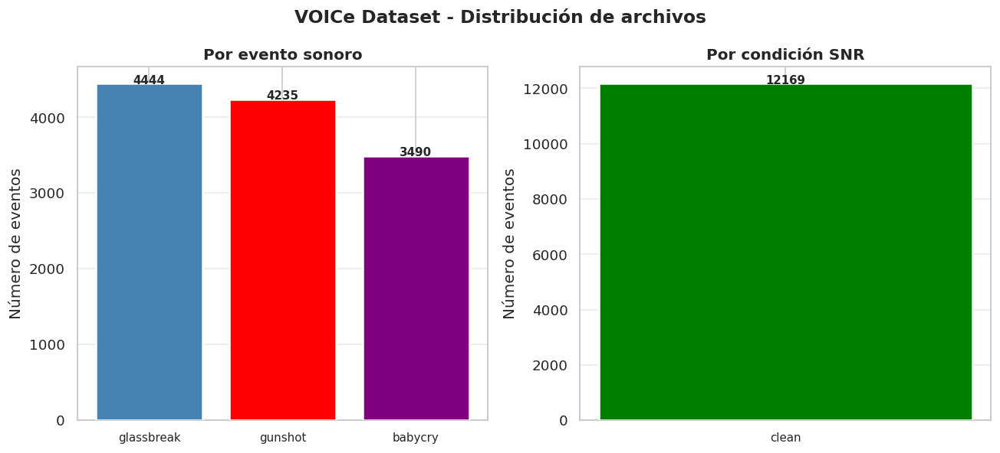

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(11, 5))
fig.suptitle('VOICe Dataset - Distribución de archivos', fontsize=14, fontweight='bold')

for ax, col, title, cmap in [
    (axes[0], 'sound_event', 'Por evento sonoro', [PALETTE.get(k,'#888') for k in df['sound_event'].value_counts().index]),
    (axes[1], 'subset', 'Por condición SNR', ['green']),
]:
    counts = df[col].value_counts()
    bars = ax.bar(counts.index, counts.values, color=cmap[:len(counts)],
                  edgecolor='white', linewidth=1.5, zorder=3)
    ax.set_title(title, fontweight='bold')
    ax.set_ylabel('Número de eventos')
    ax.grid(axis='y', alpha=0.4)
    ax.set_xticklabels([l.get_text() for l in ax.get_xticklabels()], fontsize=9)
    for bar, val in zip(bars, counts.values):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5, str(val),
                ha='center', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

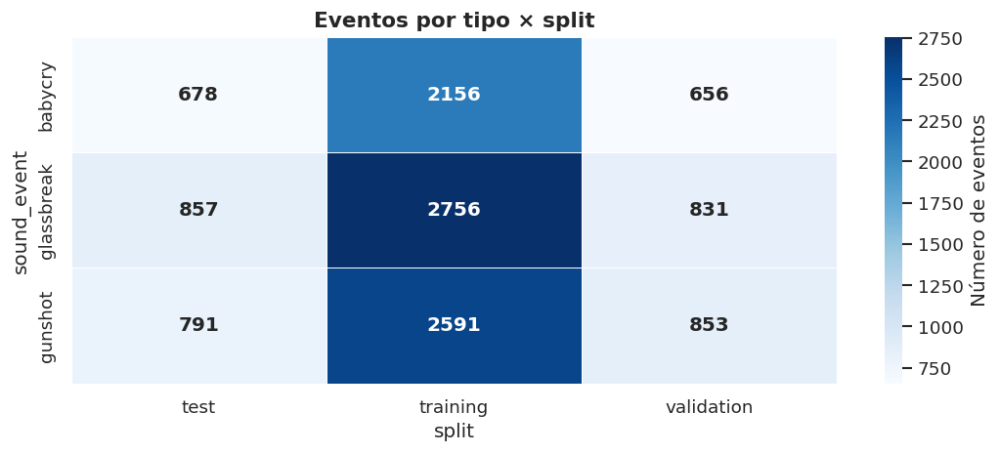

In [25]:
# Añadir columna split
split_map = {}
for split, fname in [('training', 'synthetic_source_training.txt'),
                     ('validation', 'synthetic_source_validation.txt'),
                     ('test', 'synthetic_source_test.txt')]:
    with open(f'./VOICe/clean/source/{fname}') as f:
        for wav in f.read().split():
            split_map[wav.replace('.wav','')] = split

df['split'] = df['filename'].map(split_map).fillna('unknown')

# Heatmap evento × split
pivot = df.pivot_table(index='sound_event', columns='split',
                       values='filename', aggfunc='count', fill_value=0)
fig, ax = plt.subplots(figsize=(9, 4))
sns.heatmap(pivot, annot=True, fmt='d', cmap='Blues', linewidths=0.5,
            cbar_kws={'label': 'Número de eventos'}, ax=ax,
            annot_kws={'size': 12, 'weight': 'bold'})
ax.set_title('Eventos por tipo × split', fontweight='bold', fontsize=13)
plt.tight_layout()
plt.show()

In [26]:
df['size_kb'] = df['filepath'].apply(lambda p: os.path.getsize(p) / 1024 if os.path.exists(p) else None)

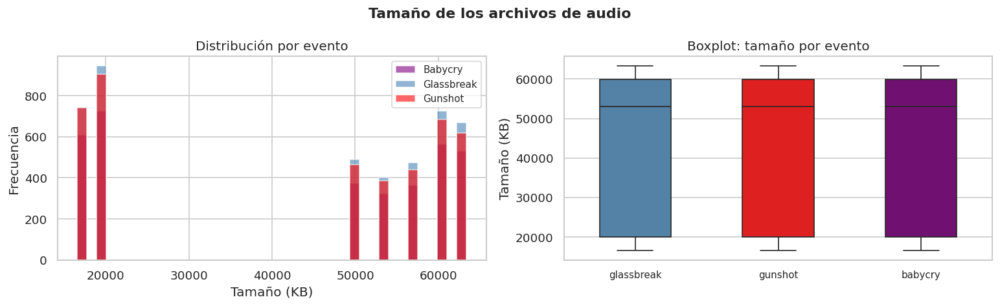

In [27]:
# Distribución del tamaño de los archivos
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
fig.suptitle('Tamaño de los archivos de audio', fontweight='bold')

for ev, grp in df.groupby('sound_event'):
    axes[0].hist(grp['size_kb'], bins=40, alpha=0.6,
                 label=ev.replace('_',' ').title(),
                 color=PALETTE.get(ev, '#888'), edgecolor='white')
axes[0].set_xlabel('Tamaño (KB)'); axes[0].set_ylabel('Frecuencia')
axes[0].set_title('Distribución por evento'); axes[0].legend(fontsize=9)

sns.boxplot(data=df, x='sound_event', y='size_kb',
            palette={k: PALETTE.get(k, 'grey') for k in df['sound_event'].unique()},
            ax=axes[1], width=0.5)
axes[1].set_title('Boxplot: tamaño por evento'); axes[1].set_xlabel('')
axes[1].set_xticklabels([l.get_text().replace('_','\n') for l in axes[1].get_xticklabels()], fontsize=9)
axes[1].set_ylabel('Tamaño (KB)')
plt.tight_layout()
plt.show()

In [28]:
print('Estadísticas de tamaño (KB) por evento:')
df.groupby('sound_event')['size_kb'].describe().round(1)

Estadísticas de tamaño (KB) por evento:


,count,mean,std,min,25%,50%,75%,max
sound_event,,,,,,,,
babycry,3490.0,42494.5,19364.3,16537.6,19982.9,53057.9,59948.5,63393.8
glassbreak,4444.0,42588.0,19301.3,16537.6,19982.9,53057.9,59948.5,63393.8
gunshot,4235.0,42218.8,19364.2,16537.6,19982.9,53057.9,59948.5,63393.8


## **5. Análisis de señal individual**

In [29]:
def plot_audio(filepath, title='', sr_target=22050):
    """Waveform + Mel spectrogram + STFT + MFCCs + Chromagram."""
    y, sr = librosa.load(filepath, sr=sr_target)
    duration = librosa.get_duration(y=y, sr=sr)

    fig = plt.figure(figsize=(14, 8))
    fig.suptitle(f'{title} | {os.path.basename(filepath)} | {duration:.2f}s | SR={sr} Hz',
                 fontsize=11, fontweight='bold')
    gs = gridspec.GridSpec(3, 2, hspace=0.5, wspace=0.35)

    ax1 = fig.add_subplot(gs[0, :])
    librosa.display.waveshow(y, sr=sr, ax=ax1, color='steelblue', alpha=0.85)
    ax1.set_title('Forma de onda'); ax1.set_xlabel('Tiempo (s)'); ax1.set_ylabel('Amplitud')

    ax2 = fig.add_subplot(gs[1, 0])
    S_db = librosa.power_to_db(librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128), ref=np.max)
    img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', ax=ax2, cmap='magma')
    fig.colorbar(img, ax=ax2, format='%+2.0f dB'); ax2.set_title('Espectrograma Mel')

    ax3 = fig.add_subplot(gs[1, 1])
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    img2 = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', ax=ax3, cmap='viridis')
    fig.colorbar(img2, ax=ax3, format='%+2.0f dB'); ax3.set_title('STFT (log)')

    ax4 = fig.add_subplot(gs[2, 0])
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    img3 = librosa.display.specshow(mfccs, sr=sr, x_axis='time', ax=ax4, cmap='coolwarm')
    fig.colorbar(img3, ax=ax4); ax4.set_title('MFCCs (13)'); ax4.set_ylabel('MFCC')

    ax5 = fig.add_subplot(gs[2, 1])
    chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
    img4 = librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', ax=ax5, cmap='Greens')
    fig.colorbar(img4, ax=ax5); ax5.set_title('Cromograma')

    plt.show()

    print(f'Duración: {duration:.2f} s')
    print(f'Sample rate: {sr} Hz')
    print(f'Número de muestras: {len(y)}')
    print(f'Amplitud máxima: {np.max(np.abs(y)):.4f}')
    print(f'RMS energy: {np.sqrt(np.mean(y**2)):.4f}')
    print(f'Zero-crossing rate: {np.mean(librosa.feature.zero_crossing_rate(y)):.4f}')
    return y, sr


BABYCRY


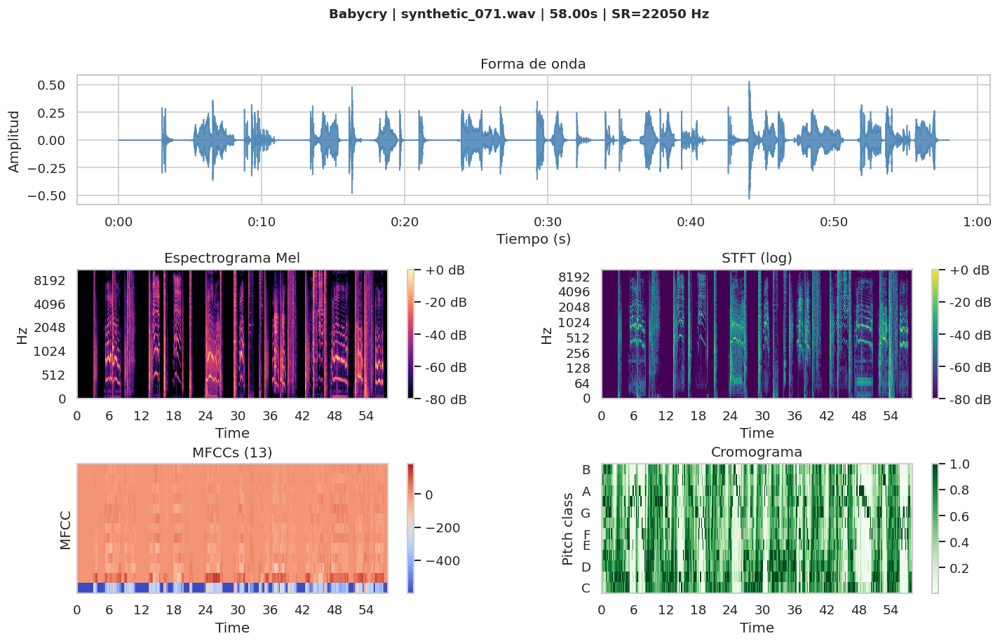

Duración: 58.00 s
Sample rate: 22050 Hz
Número de muestras: 1278900
Amplitud máxima: 0.5319
RMS energy: 0.0350
Zero-crossing rate: 0.1521



GLASSBREAK


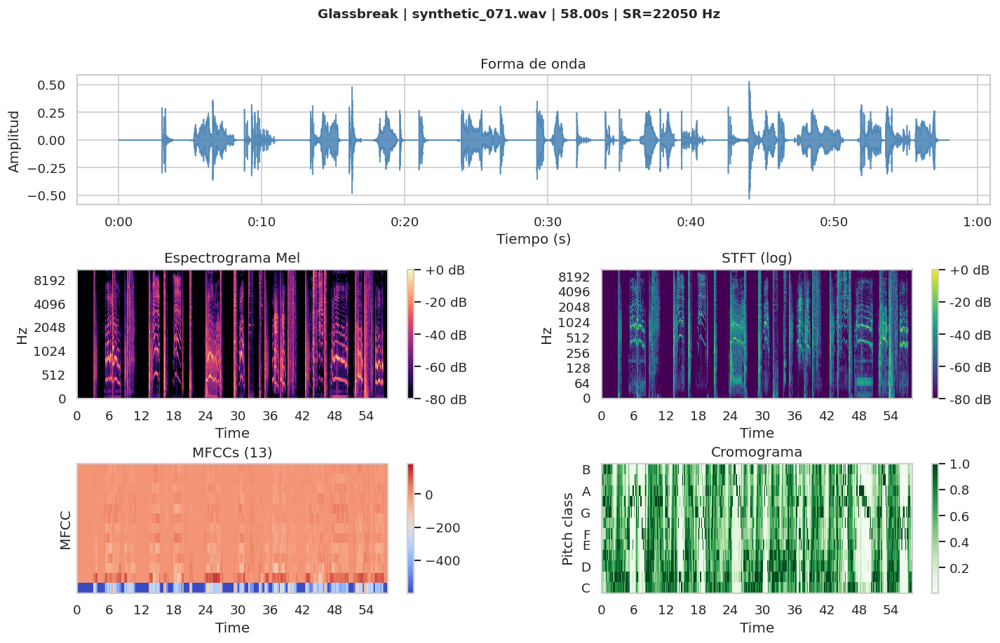

Duración: 58.00 s
Sample rate: 22050 Hz
Número de muestras: 1278900
Amplitud máxima: 0.5319
RMS energy: 0.0350
Zero-crossing rate: 0.1521



GUNSHOT


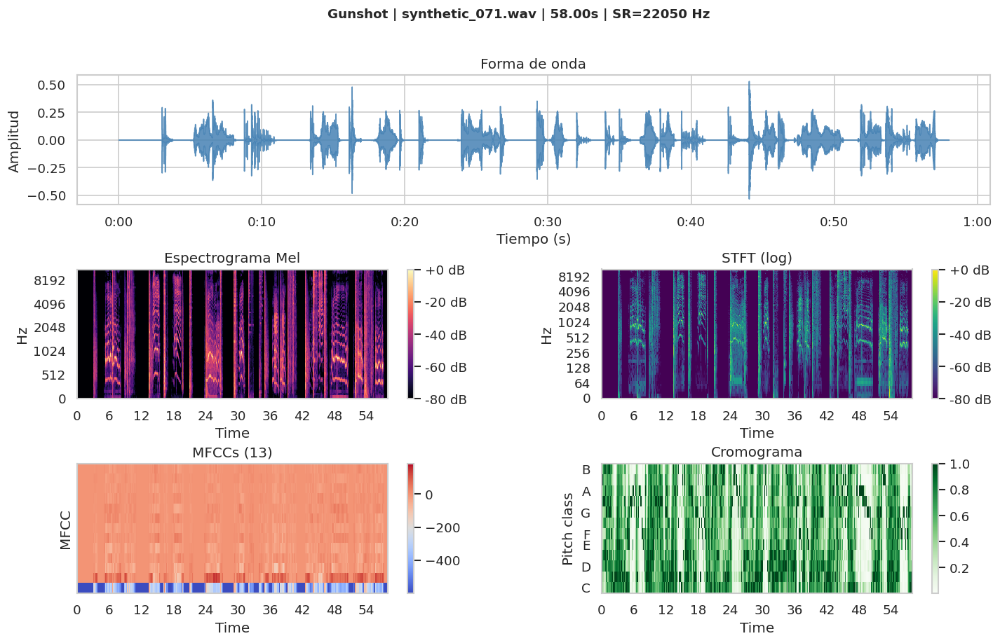

Duración: 58.00 s
Sample rate: 22050 Hz
Número de muestras: 1278900
Amplitud máxima: 0.5319
RMS energy: 0.0350
Zero-crossing rate: 0.1521


In [30]:
# Un ejemplo de cada evento sonoro
for ev in SOUND_EVENTS:
    subset = df[df['sound_event'] == ev]
    if len(subset) == 0:
        print(f'Sin archivos para: {ev}')
        continue
    print(f'\n{'='*60}')
    print(f'{ev.upper()}')
    y, sr = plot_audio(subset.iloc[0]['filepath'], title=ev.replace('_',' ').title())
    display(Audio(data=y, rate=sr))

## **6. Extracción masiva de features acústicas**


In [31]:
def extract_features(filepath, sr_target=22050):
    y, sr = librosa.load(filepath, sr=sr_target)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    zcr = librosa.feature.zero_crossing_rate(y)
    rms = librosa.feature.rms(y=y)
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
    bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
    rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=0.85)
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)

    feats = {
        'duration': librosa.get_duration(y=y, sr=sr),
        'rms_mean': float(np.mean(rms)),
        'rms_std': float(np.std(rms)),
        'zcr_mean': float(np.mean(zcr)),
        'zcr_std': float(np.std(zcr)),
        'spec_centroid': float(np.mean(centroid)),
        'spec_bandwidth': float(np.mean(bw)),
        'rolloff': float(np.mean(rolloff)),
        'chroma_mean': float(np.mean(chroma)),
    }
    for i in range(13):
        feats[f'mfcc_{i+1}_mean'] = float(np.mean(mfccs[i]))
        feats[f'mfcc_{i+1}_std'] = float(np.std(mfccs[i]))
    return feats

print(f'Extrayendo features de {len(df)} archivos...')
rows = []
for _, row in tqdm(df.iterrows(), total=len(df)):
    try:
        feats = extract_features(row['filepath'])
        feats.update({
            'subset': row['subset'],
            'sound_event': row['sound_event'],
            'filename': row['filename']
        })
        rows.append(feats)
    except Exception as e:
        print(f'Error en {row["filename"]}: {e}')

df_feats = pd.DataFrame(rows)
print(f'\nFeatures extraídas: {df_feats.shape}')

Extrayendo features de 12169 archivos...


100%|██████████| 12169/12169 [5:30:14<00:00,  1.63s/it]



Features extraídas: (12169, 38)


In [32]:
df_feats.head()

,duration,rms_mean,rms_std,zcr_mean,zcr_std,spec_centroid,spec_bandwidth,rolloff,chroma_mean,mfcc_1_mean,...,mfcc_10_std,mfcc_11_mean,mfcc_11_std,mfcc_12_mean,mfcc_12_std,mfcc_13_mean,mfcc_13_std,subset,sound_event,filename
0,58.0,0.020884,0.028034,0.152094,0.161208,2350.223052,1752.083069,4327.678168,0.276573,-412.262451,...,10.109814,-3.243051,9.313715,-2.125479,8.473341,-1.943988,8.833241,clean,glassbreak,synthetic_071
1,58.0,0.020884,0.028034,0.152094,0.161208,2350.223052,1752.083069,4327.678168,0.276573,-412.262451,...,10.109814,-3.243051,9.313715,-2.125479,8.473341,-1.943988,8.833241,clean,gunshot,synthetic_071
2,58.0,0.020884,0.028034,0.152094,0.161208,2350.223052,1752.083069,4327.678168,0.276573,-412.262451,...,10.109814,-3.243051,9.313715,-2.125479,8.473341,-1.943988,8.833241,clean,babycry,synthetic_071
3,58.0,0.020884,0.028034,0.152094,0.161208,2350.223052,1752.083069,4327.678168,0.276573,-412.262451,...,10.109814,-3.243051,9.313715,-2.125479,8.473341,-1.943988,8.833241,clean,glassbreak,synthetic_071
4,58.0,0.020884,0.028034,0.152094,0.161208,2350.223052,1752.083069,4327.678168,0.276573,-412.262451,...,10.109814,-3.243051,9.313715,-2.125479,8.473341,-1.943988,8.833241,clean,gunshot,synthetic_071


In [33]:
feat_cols = ['duration','rms_mean','zcr_mean','spec_centroid','spec_bandwidth','rolloff']
print('Estadísticas por evento sonoro:')
df_feats.groupby('sound_event')[feat_cols].agg(['mean','std']).round(3)

Estadísticas por evento sonoro:


duration         rms_mean        zcr_mean        spec_centroid  \
                mean     std     mean    std     mean    std          mean   
sound_event                                                                  
babycry      123.340  56.205    0.024  0.003    0.149  0.013      2337.484   
glassbreak   123.611  56.022    0.024  0.003    0.149  0.013      2338.887   
gunshot      122.540  56.205    0.024  0.003    0.149  0.013      2337.737   

                     spec_bandwidth           rolloff           
                 std           mean     std      mean      std  
sound_event                                                     
babycry      160.638       1763.866  95.002  4284.335  284.929  
glassbreak   159.203       1764.367  94.224  4286.486  282.619  
gunshot      160.567       1763.571  95.093  4285.319  285.046

## **7. Boxplots de features**

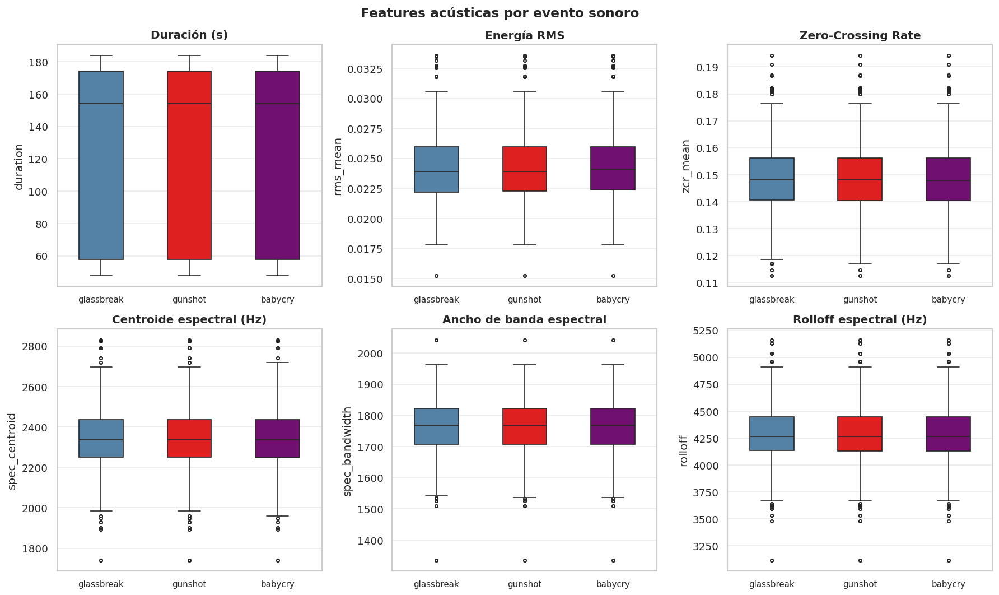

In [34]:
feat_labels = {
    'duration': 'Duración (s)', 'rms_mean': 'Energía RMS',
    'zcr_mean': 'Zero-Crossing Rate', 'spec_centroid': 'Centroide espectral (Hz)',
    'spec_bandwidth': 'Ancho de banda espectral', 'rolloff': 'Rolloff espectral (Hz)',
}

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle('Features acústicas por evento sonoro', fontsize=14, fontweight='bold')

for ax, feat in zip(axes.flat, feat_cols):
    sns.boxplot(data=df_feats, x='sound_event', y=feat, palette=PALETTE, ax=ax,
                width=0.5, flierprops={'marker':'o','markersize':3,'alpha':0.4})
    ax.set_title(feat_labels[feat], fontweight='bold'); ax.set_xlabel('')
    ax.set_xticklabels([l.get_text().replace('_','\n') for l in ax.get_xticklabels()], fontsize=9)
    ax.grid(axis='y', alpha=0.4)

plt.tight_layout()
plt.show()

In [35]:
print(df['sound_event'].unique())

['glassbreak' 'gunshot' 'babycry']


In [36]:
# Efecto del SNR (solo si hay varios subsets descargados)
if df_feats['subset'].nunique() > 1:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Efecto del nivel de ruido (SNR)', fontsize=13, fontweight='bold')

    order_snr = [s for s in ['clean','snr_-3dB','snr_-9dB'] if s in df_feats['subset'].unique()]

    sns.violinplot(data=df_feats, x='subset', y='rms_mean', hue='sound_event',
                   palette=PALETTE, inner='quartile', ax=axes[0], order=order_snr,
                   density_norm='width')
    axes[0].set_title('Energía RMS por condición SNR', fontweight='bold')
    axes[0].legend(title='Evento', fontsize=8)

    sns.boxplot(data=df_feats, x='subset', y='spec_centroid', hue='sound_event',
                palette=PALETTE, ax=axes[1], order=order_snr)
    axes[1].set_title('Centroide epectral por condición SNR', fontweight='bold')
    axes[1].legend(title='Evento', fontsize=8)

    plt.tight_layout()
    plt.show()
else:
    print('Solo hay un subset descargado. Descarga más subsets para ver el efecto del SNR.')

Solo hay un subset descargado. Descarga más subsets para ver el efecto del SNR.


## **8. Perfil de MFCCs y correlaciones**

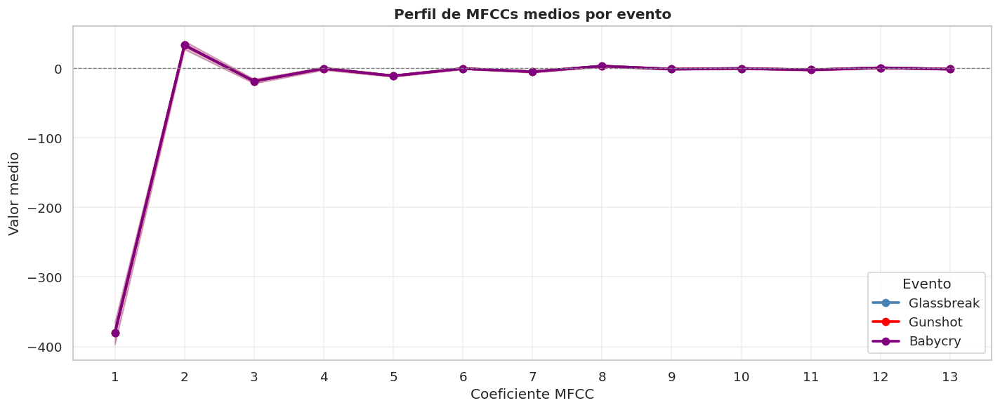

In [37]:
mfcc_cols = [f'mfcc_{i+1}_mean' for i in range(13)]
mfcc_means = df_feats.groupby('sound_event')[mfcc_cols].mean()
mfcc_stds = df_feats.groupby('sound_event')[mfcc_cols].std()

fig, ax = plt.subplots(figsize=(12, 5))
for ev in df_feats['sound_event'].unique():
    if ev not in mfcc_means.index: continue
    mu, std = mfcc_means.loc[ev].values, mfcc_stds.loc[ev].values
    ax.plot(range(1, 14), mu, marker='o', label=ev.replace('_',' ').title(),
            color=PALETTE.get(ev,'#888'), linewidth=2.2)
    ax.fill_between(range(1, 14), mu-std, mu+std, alpha=0.13, color=PALETTE.get(ev,'#888'))

ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax.set_xlabel('Coeficiente MFCC'); ax.set_ylabel('Valor medio')
ax.set_title('Perfil de MFCCs medios por evento', fontweight='bold')
ax.legend(title='Evento'); ax.set_xticks(range(1, 14)); ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

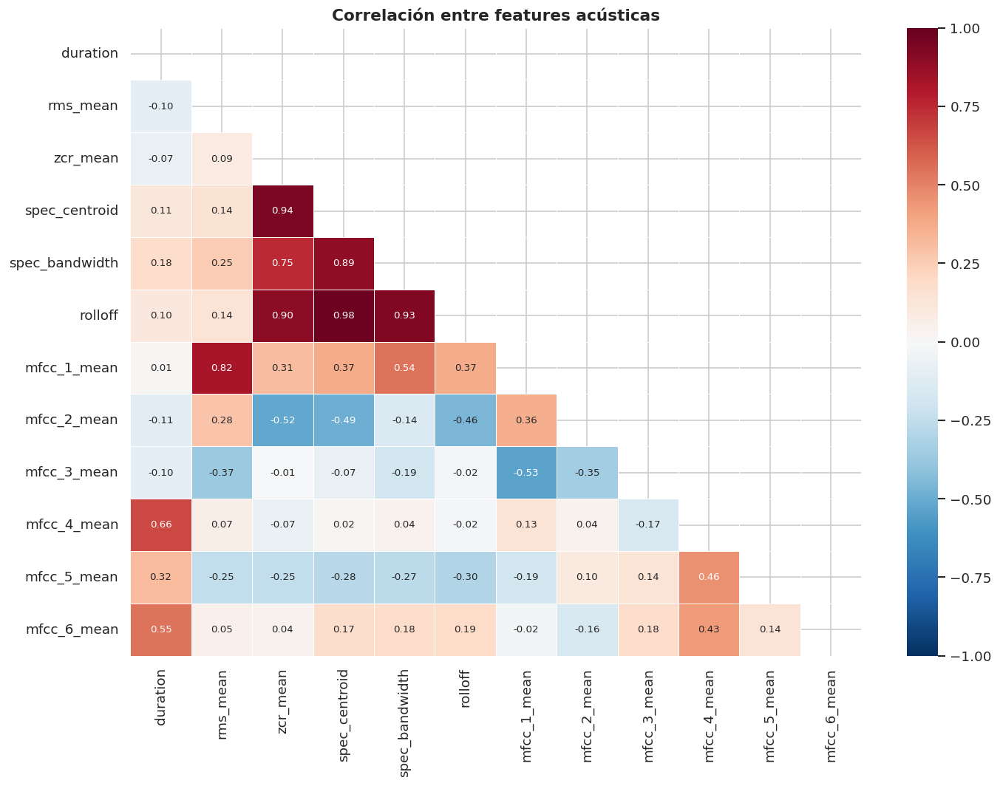

In [38]:
num_cols = feat_cols + mfcc_cols[:6]
corr = df_feats[num_cols].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

fig, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corr, mask=mask, cmap='RdBu_r', center=0, vmin=-1, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size': 8}, linewidths=0.3, ax=ax)
ax.set_title('Correlación entre features acústicas', fontweight='bold', fontsize=13)
plt.tight_layout()
plt.show()

## **9. Reducción de dimensionalidad**

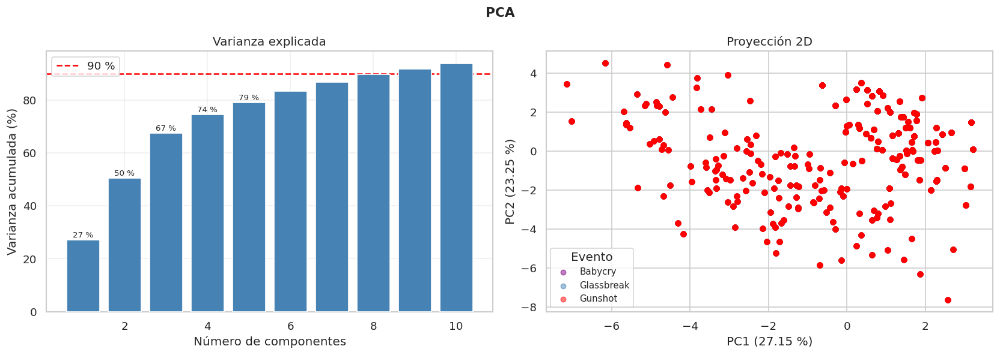

In [39]:
all_feat_cols = feat_cols + mfcc_cols
valid = df_feats[all_feat_cols + ['sound_event']].dropna()
X = valid[all_feat_cols].values
y_labels = valid['sound_event'].values
X_sc = StandardScaler().fit_transform(X)

pca = PCA(n_components=min(10, X_sc.shape[1]))
X_pca = pca.fit_transform(X_sc)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('PCA', fontsize=13, fontweight='bold')

cum_var = np.cumsum(pca.explained_variance_ratio_) * 100
axes[0].bar(range(1, len(cum_var)+1), cum_var, color='steelblue', edgecolor='white', zorder=3)
axes[0].axhline(90, color='red', linestyle='--', label='90 %', linewidth=1.5)
axes[0].set_xlabel('Número de componentes'); axes[0].set_ylabel('Varianza acumulada (%)')
axes[0].set_title('Varianza explicada'); axes[0].legend(); axes[0].grid(alpha=0.3)
for i, v in enumerate(cum_var[:5]):
    axes[0].text(i+1, v+1, f'{v:.0f} %', ha='center', fontsize=8)

for ev in np.unique(y_labels):
    m = y_labels == ev
    axes[1].scatter(X_pca[m,0], X_pca[m,1], label=ev.replace('_',' ').title(),
                    alpha=0.5, s=25, color=PALETTE.get(ev,'#888'))
axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f} %)')
axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f} %)')
axes[1].set_title('Proyección 2D'); axes[1].legend(title='Evento', fontsize=9)

plt.tight_layout()
plt.show()

Calculando t-SNE (puede tardar...


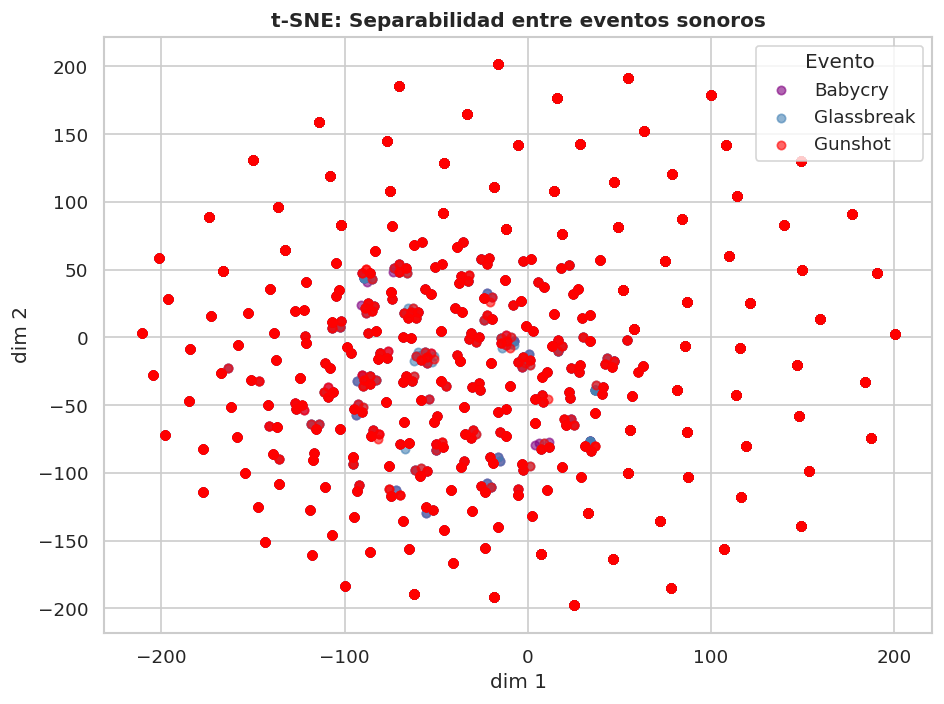

In [40]:
print('Calculando t-SNE (puede tardar...')
X_ts = TSNE(n_components=2, random_state=42, perplexity=40, max_iter=1000).fit_transform(X_sc)

fig, ax = plt.subplots(figsize=(8, 6))
for ev in np.unique(y_labels):
    m = y_labels == ev
    ax.scatter(X_ts[m,0], X_ts[m,1], label=ev.replace('_',' ').title(),
               alpha=0.6, s=25, color=PALETTE.get(ev,'#888'))
ax.set_xlabel('dim 1'); ax.set_ylabel('dim 2')
ax.set_title('t-SNE: Separabilidad entre eventos sonoros', fontweight='bold')
ax.legend(title='Evento')
plt.tight_layout()
plt.show()

## **10. Resumen**

| Aspecto | Hallazgo |
|---------|----------|
| **Balance** | Dataset perfectamente balanceado: mismo número por evento, escena y SNR. |
| **Separabilidad** | Los 3 eventos son diferenciables con ZCR, RMS y centroide espectral. |
| **Efecto SNR** | A mayor ruido, mayor solapamiento entre clases, por lo que diferenciar es más difícil. |
| **Features clave** | ZCR, duración, spec_centroid, MFCC 2-6 son las más discriminativas. |
| **Correlaciones** | spec_centroid y rolloff muy correlados; MFCC-1 y rms también. |
| **Para modelos** | Hay 3 dominios bien definidos y balanceados. |